# Data Exploration
**By Lorena Dorado & Parisa Kamizi**

**Acknowledgment:** This notebook was improved with assistance from Claude (Anthropic), which helped with code optimization and analysis techniques.

<a id="toc"></a>
# Table of Contents
- Data Exploration
  - [Load Data](#load-data)
  - [Descriptive Statistics](#descriptive-statistics)
- [Feature Analysis for Independent Variables](#feature-analysis)
  - [Frequency Distributions](#frequency-distributions)
  - [Target Variable Analysis](#target-variable-analysis)
  - [Multivariate Analyses](#multivariate-analyses)
  - [Text Features](#text-features)
  - [Handle Missing Values](#missing-values)
- [References](#references)

In [1]:
# Import Libraries
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import re
from sklearn.model_selection import train_test_split
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
import warnings
warnings.filterwarnings('ignore')

# Download necessary NLTK resources (only needed once)
# nltk.download()
nltk.download('punkt', quiet=True)
nltk.download('stopwords', quiet=True)
nltk.download('wordnet', quiet=True)

# web scraping
import requests
from bs4 import BeautifulSoup
import re
from urllib.parse import urlparse
import time
import datetime
import logging
import os
from pytz import timezone
import random

# Word cloud
from wordcloud import WordCloud

# US state-level choropleth
import plotly.express as px
import us

In [2]:
# Create image directory if it doesn't exist
os.makedirs('../images', exist_ok=True)

<a id="load-data"></a>
## Load Data
[⬆️ Back to Top](#toc)

In [3]:
# Original data
file_path = '../data/recalls_details.xlsx'
df = pd.read_excel(file_path)

In [4]:
# Convert Center Classification Date to datetime
df['Center Classification Date'] = pd.to_datetime(df['Center Classification Date'], errors='coerce')

# Extract temporal features
df['Classification Year'] = df['Center Classification Date'].dt.year
df['Classification Month'] = df['Center Classification Date'].dt.month
df['Classification Day'] = df['Center Classification Date'].dt.day
df['Classification DayOfWeek'] = df['Center Classification Date'].dt.dayofweek

In [5]:
# Display basic information about the dataset
print("\nDataset Information:")
print(f"Shape: {df.shape}")
print("\nColumn names:")
print(df.columns.tolist())


Dataset Information:
Shape: (95082, 21)

Column names:
['FEI Number', 'Recalling Firm Name', 'Product Type', 'Product Classification', 'Status', 'Distribution Pattern', 'Recalling Firm City', 'Recalling Firm State', 'Recalling Firm Country', 'Center Classification Date', 'Reason for Recall', 'Product Description', 'Event ID', 'Event Classification', 'Product ID', 'Center', 'Recall Details', 'Classification Year', 'Classification Month', 'Classification Day', 'Classification DayOfWeek']


In [6]:
# Display first few rows
print("\nFirst 5 rows:")
df.head()


First 5 rows:


,FEI Number,Recalling Firm Name,Product Type,Product Classification,Status,Distribution Pattern,Recalling Firm City,Recalling Firm State,Recalling Firm Country,Center Classification Date,...,Product Description,Event ID,Event Classification,Product ID,Center,Recall Details,Classification Year,Classification Month,Classification Day,Classification DayOfWeek
0,2016693,"Arizona Foods Group, Inc.",Food/Cosmetics,Class I,Completed,Domestic distribution within NV.,Phoenix,Arizona,United States,2025-02-21,...,FOOD SERVICE - Mombo s Vanilla Soft Serve Ice ...,96165,Class I,212179,CFSAN,https://www.accessdata.fda.gov/scripts/ires/?P...,2025,2,21,4
1,3012966183,Tyber Medical,Devices,Class II,Ongoing,Nationwide,Bethlehem,Pennsylvania,United States,2025-02-21,...,A.L.P.S. mvX - ANATOMIC LAT FIB PLATE 4H LT: A...,96212,Class II,212343,CDRH,https://www.accessdata.fda.gov/scripts/ires/?P...,2025,2,21,4
2,3012966183,Tyber Medical,Devices,Class II,Ongoing,Nationwide,Bethlehem,Pennsylvania,United States,2025-02-21,...,A.L.P.S. mvX -ANATOMIC LAT FIB PLATE 4H RT: An...,96212,Class II,212344,CDRH,https://www.accessdata.fda.gov/scripts/ires/?P...,2025,2,21,4
3,3012966183,Tyber Medical,Devices,Class II,Ongoing,Nationwide,Bethlehem,Pennsylvania,United States,2025-02-21,...,A.L.P.S. mvX -ANATOMIC LAT FIB PLATE 6H LT- An...,96212,Class II,212345,CDRH,https://www.accessdata.fda.gov/scripts/ires/?P...,2025,2,21,4
4,3012966183,Tyber Medical,Devices,Class II,Ongoing,Nationwide,Bethlehem,Pennsylvania,United States,2025-02-21,...,A.L.P.S. mvX- ANATOMIC LAT FIB PLATE 6H RT: An...,96212,Class II,212346,CDRH,https://www.accessdata.fda.gov/scripts/ires/?P...,2025,2,21,4


<a id="descriptive-statistics"></a>
## Descriptive Statistics
[⬆️ Back to Top](#toc)

Data types and missing value counts

In [7]:
print("\nData types:")
print(df.dtypes)
print("\nMissing values by column:")
print(df.isnull().sum())


Data types:
FEI Number                            object
Recalling Firm Name                   object
Product Type                          object
Product Classification                object
Status                                object
Distribution Pattern                  object
Recalling Firm City                   object
Recalling Firm State                  object
Recalling Firm Country                object
Center Classification Date    datetime64[ns]
Reason for Recall                     object
Product Description                   object
Event ID                               int64
Event Classification                  object
Product ID                             int64
Center                                object
Recall Details                        object
Classification Year                    int32
Classification Month                   int32
Classification Day                     int32
Classification DayOfWeek               int32
dtype: object

Missing values by column:
F

<a id="feature-analysis"></a>
## Feature Analysis for Independent Variables
[⬆️ Back to Top](#toc)

Finding One-to-one relationships

In [8]:
# Check relationship between Center and Product Type
center_product_crosstab = pd.crosstab(df['Center'], df['Product Type'])
print("Crosstab of Center vs Product Type:")
print(center_product_crosstab)

Crosstab of Center vs Product Type:
Product Type  Biologics  Devices  Drugs  Food/Cosmetics  Tobacco  Veterinary
Center                                                                      
CBER              12051        0      0               0        0           0
CDER                  0        0  16702               0        0           0
CDRH                  0    35475      0               0        0           0
CFSAN                 0        0      0           27435        0           0
CTP                   0        0      0               0        9           0
CVM                   0        0      0               0        0        3410


If there's a one-to-one relationship, each row and column will have exactly one non-zero value

In [9]:
one_to_one = True
for i, row in center_product_crosstab.iterrows():
    if row.astype(bool).sum() != 1:
        one_to_one = False
        break
print(f"One-to-one relationship between Center and Product Type: {one_to_one}")

One-to-one relationship between Center and Product Type: True


Check relationship between Product Classification and Event Classification

In [10]:
# Crosstab of Product Classification vs Event Classification
classification_crosstab = pd.crosstab(df['Product Classification'], df['Event Classification'])
print("\nCrosstab of Product Classification vs Event Classification:")
print(classification_crosstab)


Crosstab of Product Classification vs Event Classification:
Event Classification    Class I  Class II  Class III
Product Classification                              
Class I                   18218         0          0
Class II                   1779     66640          0
Class III                   114       685       7646


Calculate correlation coefficient (if they're perfect matches, should be 1.0)

In [11]:
# Encode
from sklearn.preprocessing import LabelEncoder

le_product = LabelEncoder()
le_event = LabelEncoder()

df['Product_Classification_Encoded'] = le_product.fit_transform(df['Product Classification'])
df['Event_Classification_Encoded'] = le_event.fit_transform(df['Event Classification'])

correlation = df['Product_Classification_Encoded'].corr(df['Event_Classification_Encoded'])
print(f"\nCorrelation between Product Classification and Event Classification: {correlation}")


Correlation between Product Classification and Event Classification: 0.9451189538117116


In [12]:
# Check if they're identical
identical = (df['Product Classification'] == df['Event Classification']).all()
print(f"Product Classification and Event Classification are identical: {identical}")

# If not identical, show examples where they differ
if not identical:
    print("\nExamples where classifications differ:")
    diff_examples = df[df['Product Classification'] != df['Event Classification']].head(5)
    print(diff_examples[['Product Classification', 'Event Classification']])
    
    # Calculate percentage of matching values
    match_percentage = (df['Product Classification'] == df['Event Classification']).mean() * 100
    print(f"\nPercentage of records where classifications match: {match_percentage:.2f}%")

Product Classification and Event Classification are identical: False

Examples where classifications differ:
    Product Classification Event Classification
127              Class III             Class II
128              Class III             Class II
129              Class III             Class II
130              Class III             Class II
467               Class II              Class I

Percentage of records where classifications match: 97.29%


The high correlation suggest multicollinearity, however the dependent variable 'Product Classification' will still be included in the model separating classes effectively and reducing the need for complex models.

<a id="frequency-distributions"></a>
#### Frequency Distributions
[⬆️ Back to Top](#toc)

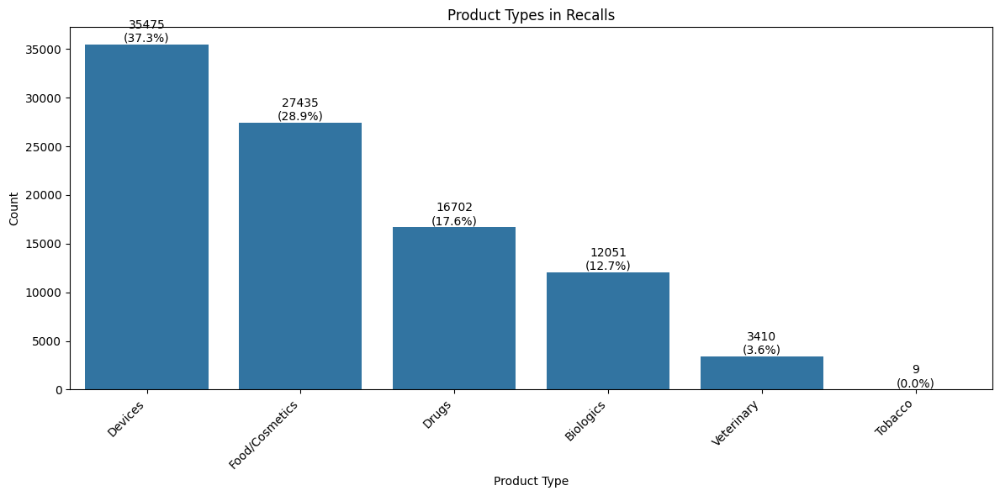

In [13]:
# Product Type Distribution
plt.figure(figsize=(12, 6))
top_types = df['Product Type'].value_counts().head(10)
ax = sns.barplot(x=top_types.index, y=top_types.values)
plt.title('Product Types in Recalls')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Count')

# Add percentage labels
total = len(df)
for p in ax.patches:
    percentage = f'{100 * p.get_height() / total:.1f}%'
    ax.annotate(f'{int(p.get_height())}\n({percentage})', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='bottom')
plt.tight_layout()
plt.savefig('../images/EDA_Product_Type_in_Recalls.png', dpi=300)

In [14]:
# Distribution by FDA Center
print("\nDistribution by FDA Center:")
print(df['Center'].value_counts())
print(df['Center'].value_counts(normalize=True) * 100)

# Count of unique Event IDs and products per event
event_counts = df.groupby('Event ID')['Product ID'].count()
print("\nProducts per recall event:")
print(f"Min: {event_counts.min()}")
print(f"Max: {event_counts.max()}")
print(f"Mean: {event_counts.mean():.2f}")
print(f"Median: {event_counts.median()}")


Distribution by FDA Center:
Center
CDRH     35475
CFSAN    27435
CDER     16702
CBER     12051
CVM       3410
CTP          9
Name: count, dtype: int64
Center
CDRH     37.309901
CFSAN    28.854042
CDER     17.565890
CBER     12.674323
CVM       3.586378
CTP       0.009466
Name: proportion, dtype: float64

Products per recall event:
Min: 1
Max: 470
Mean: 2.77
Median: 1.0


**Product Type and Their Center Association**

| Product Type     | Center  |
|-----------------|---------|
| Devices        | CDRH    |
| Food/Cosmetics | CFSAN   |
| Drugs          | CDER    |
| Biologics      | CBER    |
| Veterinary     | CVM     |
| Tobacco        | CTP     |

Each product type is uniquely associated with an FDA Center; therefore, only the Product Type will be retained in modeling to eliminate redundancy.

In [15]:
# Categorical Features
categorical_features = ['Status', 'Recalling Firm State', 'Recalling Firm Country']

for feature in categorical_features:
    print(f"\nDistribution of {feature}:")
    value_counts = df[feature].value_counts().head(10)  # Top 10 values
    print(value_counts)


Distribution of Status:
Status
Terminated    80276
Ongoing       13151
Completed      1655
Name: count, dtype: int64

Distribution of Recalling Firm State:
Recalling Firm State
California       10104
Illinois          6308
Florida           6216
New Jersey        5096
Pennsylvania      4559
New York          4494
Massachusetts     4367
-                 4331
Texas             4322
Ohio              3562
Name: count, dtype: int64

Distribution of Recalling Firm Country:
Recalling Firm Country
United States     90751
Canada              911
Germany             416
United Kingdom      282
China               280
Switzerland         278
Israel              248
Japan               223
India               209
Netherlands         205
Name: count, dtype: int64


In [16]:
# Dictionary mapping full state names to abbreviations

state_counts = df[df['Recalling Firm Country'] == 'United States']['Recalling Firm State'].value_counts().reset_index()
state_counts.columns = ['state', 'count']

# Generate a dictionary mapping state names to abbreviations
state_abbreviation_map = {state.name: state.abbr for state in us.states.STATES}

# Map the state names to abbreviations
state_counts['state'] = state_counts['state'].map(state_abbreviation_map)

# Create the choropleth map
fig = px.choropleth(state_counts, 
                    locations='state', 
                    locationmode="USA-states", 
                    color='count',
                    scope="usa",
                    color_continuous_scale="Viridis",
                    title="Number of Recalls by State")

# Update the color bar title
fig.update_layout(coloraxis_colorbar=dict(title="Number of Recalls"))
fig.write_image("../images/EDA_recalls_by_state.png")

# Show the map
fig.show()

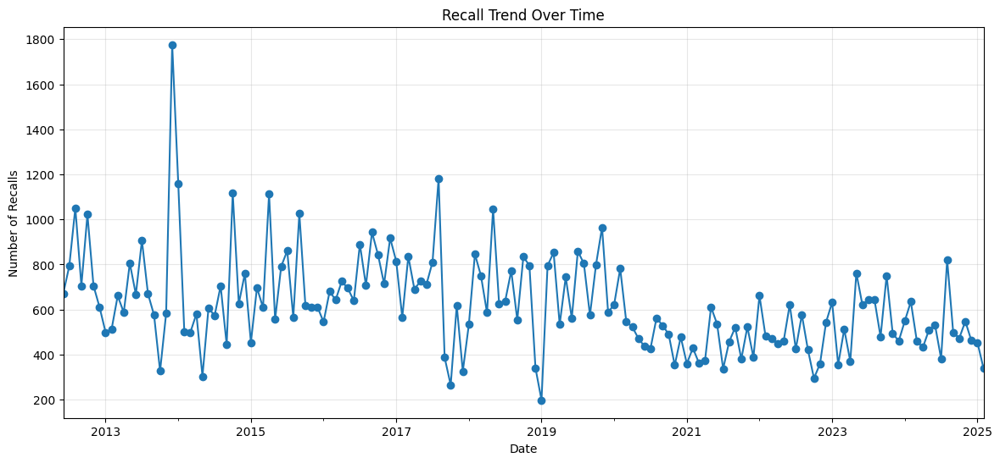

In [17]:
# Time series of recalls by month-year
recalls_by_date = df.groupby([df['Classification Year'], df['Classification Month']]).size()
recalls_by_date = recalls_by_date.reset_index()
recalls_by_date['Date'] = pd.to_datetime(recalls_by_date['Classification Year'].astype(str) + '-' + 
                                          recalls_by_date['Classification Month'].astype(str) + '-01')
recalls_by_date = recalls_by_date.set_index('Date')[0]

plt.figure(figsize=(14, 6))
recalls_by_date.plot(marker='o', linestyle='-')
plt.title('Recall Trend Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Recalls')
plt.grid(True, alpha=0.3)
plt.savefig('../images/EDA_Recall_Trend_Over_Time.png')

The number of monthly recalls has shown a general downward trend over time. Recall volumes range from 600-1000 per month from 2012 to 2018. From 2020 and onward, it decreases from 400-600 per month. A noticeable spike occurred in early 2014, reaching almost 1,800 recalls. The cyclical patterns suggest periodic fluctuations, but they are not consistent. The early years (2012-2018) shows greater fluctuations compared to 2019-2025. Late 2012, early 2015, and mid 2017 exceeded 1,000 recalls per month, however recall numbers have stabilized at a lower and more consistent level since 2020.

In [18]:
# Recall counts by year
print("\nRecalls by year:")
year_counts = df['Classification Year'].value_counts().sort_index()
print(year_counts)

# Recalls by month
print("\nRecalls by month:")
month_counts = df['Classification Month'].value_counts().sort_index()
print(month_counts)

# Recalls by day of week
print("\nRecalls by day of week:")
day_mapping = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
df['Day_Name'] = df['Classification DayOfWeek'].map(day_mapping)
print(df['Day_Name'].value_counts())

# Classification distribution by year
print("\nClass distribution by year:")
year_class = pd.crosstab(df['Classification Year'], df['Event Classification'])
print(year_class)


Recalls by year:
Classification Year
2012    5559
2013    8573
2014    7878
2015    8511
2016    8941
2017    7933
2018    8321
2019    8274
2020    6224
2021    5278
2022    5769
2023    6726
2024    6301
2025     794
Name: count, dtype: int64

Recalls by month:
Classification Month
1     7485
2     7623
3     7202
4     6965
5     7692
6     8019
7     8546
8     9518
9     7660
10    8216
11    7895
12    8261
Name: count, dtype: int64

Recalls by day of week:
Day_Name
Thursday     20715
Tuesday      19520
Wednesday    19175
Friday       18961
Monday       14707
Saturday      1491
Sunday         513
Name: count, dtype: int64

Class distribution by year:
Event Classification  Class I  Class II  Class III
Classification Year                               
2012                     1544      3377        638
2013                     2021      5634        918
2014                     1556      5767        555
2015                     2059      5867        585
2016                     207

<Figure size 1200x700 with 0 Axes>

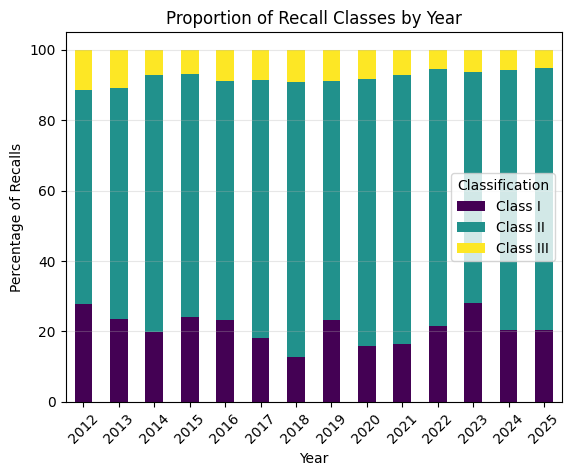

In [19]:
# Stacked percentage bar chart
year_class_pct = year_class.div(year_class.sum(axis=1), axis=0) * 100
plt.figure(figsize=(12, 7))
year_class_pct.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Proportion of Recall Classes by Year')
plt.xlabel('Year')
plt.ylabel('Percentage of Recalls')
plt.legend(title='Classification')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.savefig('../images/EDA_Proportion_of_Recall_Classes_by_Year.png')

<a id="target-variable-analysis"></a>
## Target Variable Analysis
[⬆️ Back to Top](#toc)

Event Classification distribution (Class I, II, III)


Target Variable (Event Classification) Distribution:
Event Classification
Class II     67325
Class I      20111
Class III     7646
Name: count, dtype: int64

Percentage distribution:
Event Classification
Class II     70.807303
Class I      21.151217
Class III     8.041480
Name: count, dtype: float64


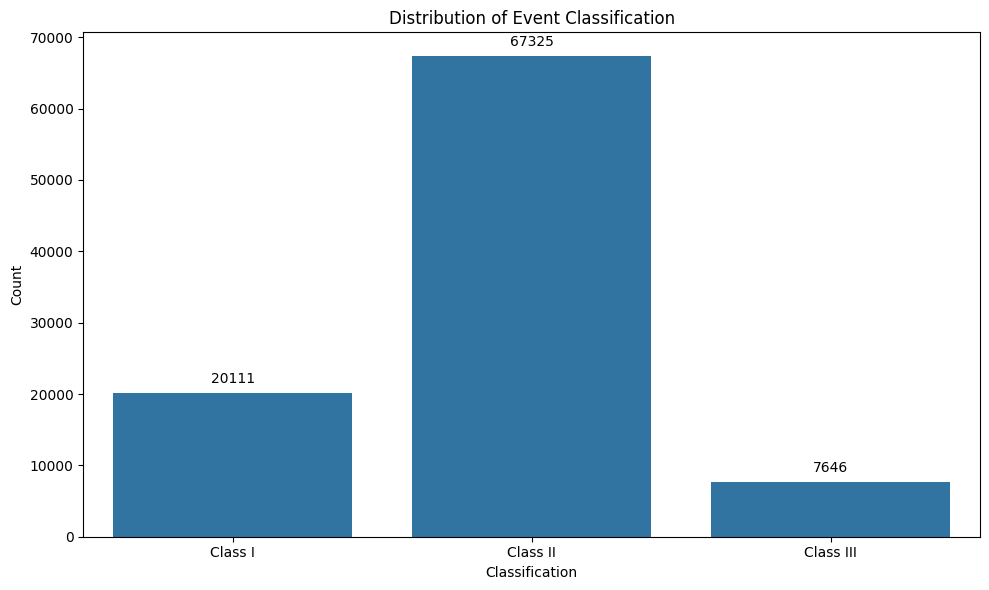

In [20]:
print("\nTarget Variable (Event Classification) Distribution:")
target_counts = df['Event Classification'].value_counts()
print(target_counts)
print("\nPercentage distribution:")
print(target_counts / len(df) * 100)

# Plot target distribution
plt.figure(figsize=(10, 6))
ax = sns.countplot(x='Event Classification', data=df)
plt.title('Distribution of Event Classification')
plt.xlabel('Classification')
plt.ylabel('Count')

# Add count labels on bars
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                xytext=(0, 10), 
                textcoords='offset points')

plt.tight_layout()
plt.savefig('../images/EDA_event_classification_distribution.png')

<a id="multivariate-analyses"></a>
## Multivariae Analyses
[⬆️ Back to Top](#toc)

Temporal heatmap showing proportion of Class I recalls by year-month

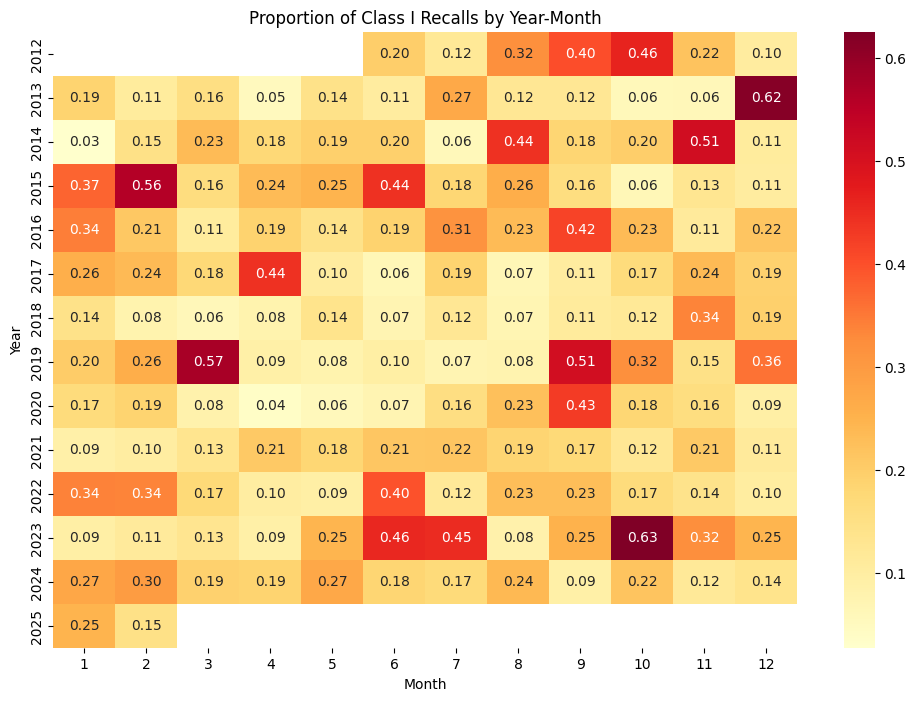

In [21]:
# Create Year-Month column
temporal_data = df.copy()
temporal_data['YearMonth'] = temporal_data['Classification Year'].astype(str) + '-' + temporal_data['Classification Month'].astype(str)

# Calculate the proportion of Class I recalls
class_proportion = temporal_data.groupby(['Classification Year', 'Classification Month'])['Event Classification'].apply(
    lambda x: (x == 'Class I').mean()).reset_index(name='Class_I_Proportion')

# Create pivot table (Fix: use keyword arguments)
pivot_data = class_proportion.pivot(index='Classification Year', columns='Classification Month', values='Class_I_Proportion')

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_data, annot=True, cmap='YlOrRd', fmt='.2f')
plt.title('Proportion of Class I Recalls by Year-Month')
plt.xlabel('Month')
plt.ylabel('Year')
plt.savefig('../images/EDA_Proportion_of_Class_I_Recalls_by_Year-Month.png')
plt.show()

The heatmap shows the proportion of Class I recalls from 2012 to early 2025, highlighting key trends over time. Several "hotspot" months include December 2013 (0.62), November 2014 (0.51), February 2015 (0.56), March 2019 (0.57), September 2019 (0.51), and November 2023 (0.63), showing high recall proportions.

Periods that showed high-risk levels, such as mid-2023, where multiple months had more Class I recalls. There were aslo high proportions in January and February during early 2025. Mid 2019 had notable spikes in March and September, indicating ongoing recall risks.

Some months had low Class I recall proportions, such as January 2014 (0.03), April 2020 (0.04), and several months in 2018, which consistently remained below 0.10, suggesting periods of relatively lower recall severity.

In [22]:
# Chi-square test for Product Type vs. Classification
product_class_table = pd.crosstab(df['Product Type'], df['Event Classification'])
chi2, p, dof, expected = stats.chi2_contingency(product_class_table)
print(f"Chi-square: {chi2}, p-value: {p}")

# Visualize with standardized residuals to identify cells contributing to significance
residuals = stats.chi2_contingency(product_class_table)[3]
standardized_residuals = (product_class_table - residuals) / np.sqrt(residuals)

Chi-square: 27420.117458956596, p-value: 0.0


There is a significant association between Product Type and Event Classification.

Cardinality of categorical variables

In [23]:
# Create a table showing cardinality of categorical variables
categorical_vars = [ 
    'Recalling Firm Name',
    'Product Type',
    'Product Classification',
    'Status',
    'Distribution Pattern',
    'Recalling Firm City',
    'Recalling Firm State',
    'Recalling Firm Country',
    'Event Classification'
]

# Initialize an empty dictionary to store the results
cardinality_dict = {}

# Count unique values for each categorical variable
for var in categorical_vars:
    if var in df.columns:
        # Count unique values
        n_unique = df[var].nunique()
        # Count missing values
        n_missing = df[var].isna().sum()
        # Calculate percentage of total
        pct_unique = (n_unique / len(df)) * 100
        
        # Store results
        cardinality_dict[var] = {
            'Count of Unique Values': n_unique,
            'Missing Values': n_missing,
            'Unique as % of Total': round(pct_unique, 2)
        }

# Convert to DataFrame for better display
cardinality_df = pd.DataFrame(cardinality_dict).T
cardinality_df = cardinality_df.sort_values('Count of Unique Values', ascending=False)

# Display the table
print("Cardinality Analysis of Categorical Variables:")
print(cardinality_df)

Cardinality Analysis of Categorical Variables:
                        Count of Unique Values  Missing Values  \
Distribution Pattern                   20312.0             1.0   
Recalling Firm Name                     9927.0             0.0   
Recalling Firm City                     3263.0             0.0   
Recalling Firm Country                    56.0             0.0   
Recalling Firm State                      54.0             0.0   
Product Type                               6.0             0.0   
Product Classification                     3.0             0.0   
Status                                     3.0             0.0   
Event Classification                       3.0             0.0   

                        Unique as % of Total  
Distribution Pattern                   21.36  
Recalling Firm Name                    10.44  
Recalling Firm City                     3.43  
Recalling Firm Country                  0.06  
Recalling Firm State                    0.06  
Product Ty

Identify high-cardinality variables (>100 unique values)

In [24]:
high_cardinality_vars = cardinality_df[cardinality_df['Count of Unique Values'] > 100].index.tolist()
print("\nHigh-cardinality variables (>100 unique values):")
for var in high_cardinality_vars:
    print(f"- {var}: {cardinality_df.loc[var, 'Count of Unique Values']} unique values")


High-cardinality variables (>100 unique values):
- Distribution Pattern: 20312.0 unique values
- Recalling Firm Name: 9927.0 unique values
- Recalling Firm City: 3263.0 unique values


<a id="text-features"></a>
## Text Features
[⬆️ Back to Top](#toc)

In [25]:
# Define function for basic text cleaning
def clean_text(text):
    if not isinstance(text, str):
        return ""
    
    # Convert to lowercase
    text = text.lower()
    
    # Remove special characters, digits, and extra spaces
    text = re.sub(r'[^\w\s]', ' ', text)
    text = re.sub(r'\d+', ' ', text)
    text = re.sub(r'\s+', ' ', text)
    
    # Tokenize
    tokens = word_tokenize(text)
    
    # Remove stop words
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]
    
    # Lemmatize
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    
    return ' '.join(tokens)

# Apply text cleaning to text columns
text_features = ['Reason for Recall', 'Product Description']
for feature in text_features:
    print(f"\nProcessing {feature}...")
    df[f'{feature}_cleaned'] = df[feature].apply(clean_text)
    
    # Display sample of original and cleaned text
    print("\nSample of original and cleaned text:")
    sample_idx = np.random.randint(0, len(df))
    print(f"Original: {df.loc[sample_idx, feature][:200]}...")
    print(f"Cleaned: {df.loc[sample_idx, f'{feature}_cleaned'][:200]}...")


Processing Reason for Recall...

Sample of original and cleaned text:
Original: Issue 1: Mixed Images: The Radio Fluoroscopy (RF) viewer may also display a previous patients radiography (RAD) images when starting the next patient scan while the previous patient image export is st...
Cleaned: issue mixed image radio fluoroscopy rf viewer may also display previous patient radiography rad image starting next patient scan previous patient image export still processing issue occurs potential i...

Processing Product Description...

Sample of original and cleaned text:
Original: Arrow Maximal Barrier Drape_x000D_
ASK-00002-1A...
Cleaned: arrow maximal barrier drape_x d_ ask...


<a id="missing-values"></a>
## Handle Missing Values
[⬆️ Back to Top](#toc)

In [26]:
# Extract domain and check if URL is accessible
df['Has_Recall_URL'] = df['Recall Details'].notna() & df['Recall Details'].str.contains('http', case=False, na=False)

In [27]:
# For categorical features, fill with 'Unknown'
for feature in categorical_features:
    df[feature] = df[feature].fillna('Unknown')

# For text features, fill with empty string
for feature in text_features:
    df[feature] = df[feature].fillna('')
    df[f'{feature}_cleaned'] = df[f'{feature}_cleaned'].fillna('')

Feature Selection for Dataset

In [28]:
# Select features to use in the model
selected_features = [
    # Categorical features
    'Product Type', 
    'Status', 
    'Recalling Firm State', 
    'Recalling Firm Country',
    
    # Temporal features
    'Classification Year',
    'Classification Month',
    'Classification Day',
    'Classification DayOfWeek',
    
    # Text features (cleaned)
    'Reason for Recall_cleaned',
    'Product Description_cleaned',
    
    # URL feature
    'Has_Recall_URL'
]

# Target variable
target = 'Event Classification'

# Remove rows with missing target values
print(f"\nRows before removing missing target values: {len(df)}")
df = df.dropna(subset=[target])
print(f"Rows after removing missing target values: {len(df)}")


Rows before removing missing target values: 95082
Rows after removing missing target values: 95082


 ## Descriptive Statistics For Text Data

In [29]:
# Word count statistics for text fields
df['Reason_Word_Count'] = df['Reason for Recall'].apply(lambda x: len(str(x).split()))
print("\nWord count statistics for Reason for Recall:")
print(df['Reason_Word_Count'].describe())

# Most common words in recall reasons by classification
from collections import Counter

# For Class I recalls
class_i_words = ' '.join(df[df['Event Classification'] == 'Class I']['Reason for Recall_cleaned']).split()
print("\nTop 20 words in Class I recall reasons:")
print(Counter(class_i_words).most_common(20))


Word count statistics for Reason for Recall:
count    95082.000000
mean        21.726163
std         17.512806
min          1.000000
25%         10.000000
50%         17.000000
75%         28.000000
max        327.000000
Name: Reason_Word_Count, dtype: float64

Top 20 words in Class I recall reasons:
[('product', 10617), ('listeria', 6310), ('monocytogenes', 6164), ('may', 5582), ('contaminated', 5251), ('potential', 5098), ('contamination', 3610), ('salmonella', 3438), ('undeclared', 2804), ('due', 2725), ('recalled', 2447), ('contain', 2244), ('food', 2023), ('various', 1978), ('recalling', 1946), ('recall', 1939), ('firm', 1775), ('fresh', 1597), ('manufactured', 1504), ('peanut', 1503)]


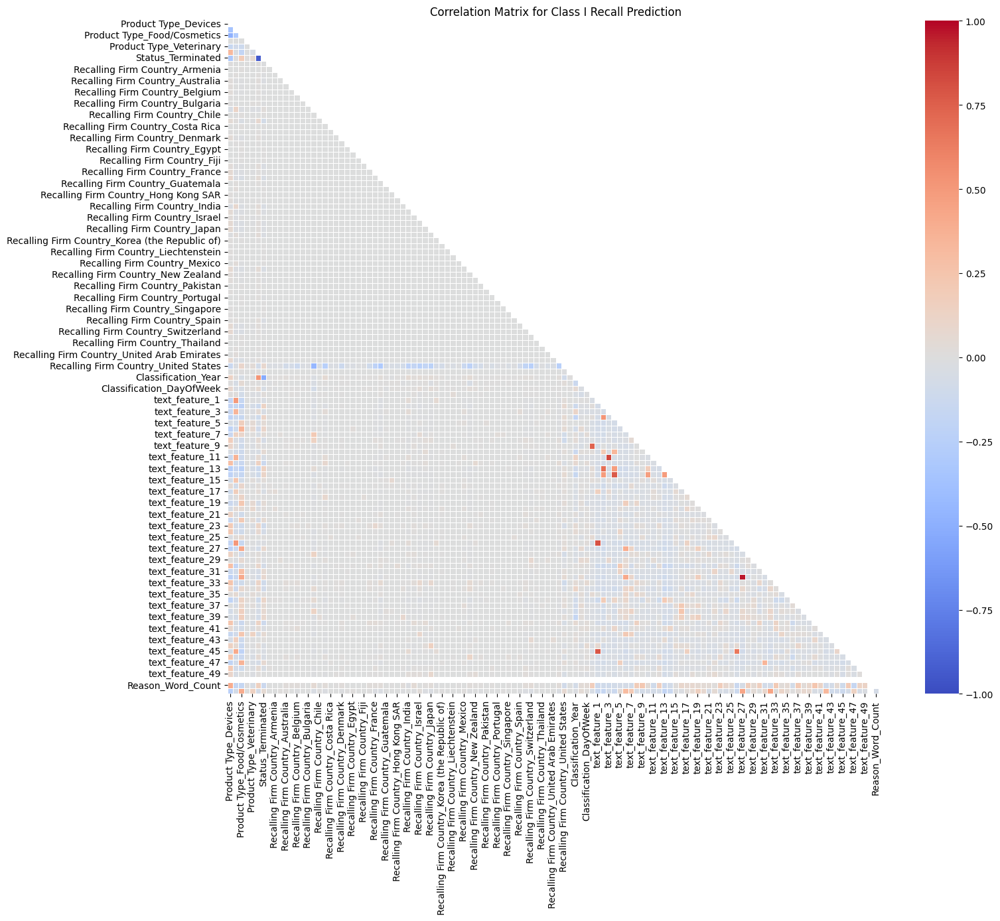

In [30]:
# Create a comprehensive dataframe with all potential predictors
analysis_df = pd.DataFrame()

# Add categorical dummy variables (with drop_first=True to avoid perfect multicollinearity)
categorical_dummies = pd.get_dummies(df[['Product Type', 'Status', 'Recalling Firm Country']], 
                                    drop_first=True)
analysis_df = pd.concat([analysis_df, categorical_dummies], axis=1)

# Add temporal features
analysis_df['Classification_Year'] = df['Classification Year']
analysis_df['Classification_Month'] = df['Classification Month']
analysis_df['Classification_DayOfWeek'] = df['Classification DayOfWeek']

# Add text features (using a limited number of TF-IDF features)
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(max_features=50)
text_features = tfidf.fit_transform(df['Reason for Recall_cleaned']).toarray()
text_df = pd.DataFrame(text_features, 
                      columns=[f'text_feature_{i}' for i in range(text_features.shape[1])])
analysis_df = pd.concat([analysis_df, text_df], axis=1)

# Add other features
analysis_df['Has_Recall_URL'] = df['Has_Recall_URL']
analysis_df['Reason_Word_Count'] = df['Reason_Word_Count']

# Add target variable (1 for Class I, 0 for others)
analysis_df['Is_Class_I'] = (df['Event Classification'] == 'Class I').astype(int)

# Calculate and visualize correlation matrix
corr_matrix = analysis_df.corr()
plt.figure(figsize=(16, 14))
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))  # Create mask for upper triangle
sns.heatmap(corr_matrix, mask=mask, cmap='coolwarm', vmin=-1, vmax=1, 
           center=0, annot=False, linewidths=.5)
plt.title('Correlation Matrix for Class I Recall Prediction')
plt.tight_layout()

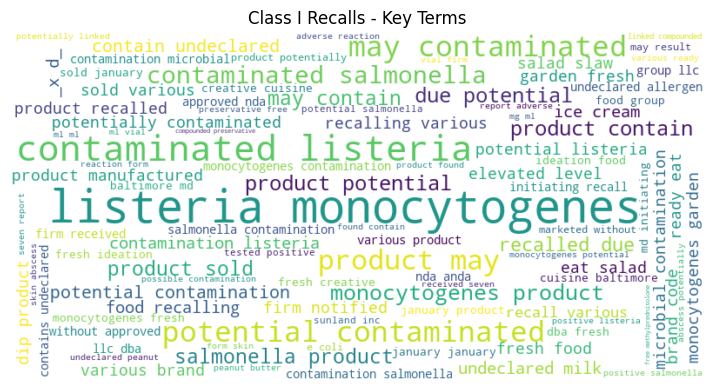

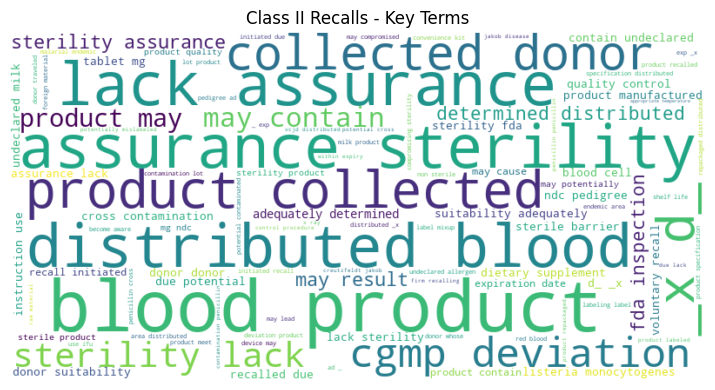

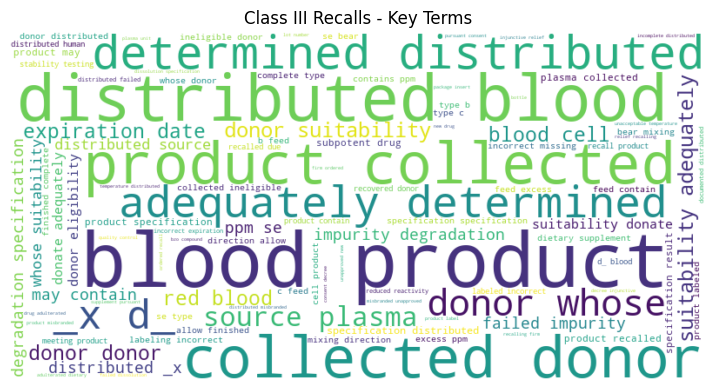

In [31]:
# Create word clouds for each class, each in its own image
for i, class_type in enumerate(['Class I', 'Class II', 'Class III']):
    class_text = ' '.join(df[df['Event Classification'] == class_type]['Reason for Recall_cleaned'])
    if len(class_text) > 0:
        wordcloud = WordCloud(
            width=800, height=400, background_color='white',
            max_words=100, contour_width=1, contour_color='steelblue'
        ).generate(class_text)

        plt.figure(figsize=(10, 4))  # Create a new figure for each class
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'{class_type} Recalls - Key Terms')
        plt.axis('off')
        plt.tight_layout()

        filename = f"../images/EDA_{class_type.replace(' ', '_')}_wordcloud.png"
        plt.savefig(filename)
        plt.show() 
        plt.close()

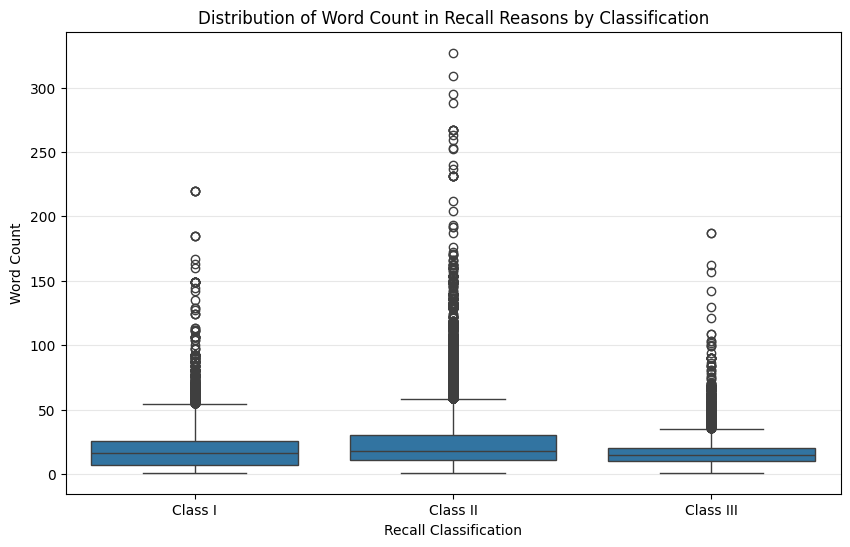

In [32]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Event Classification', y='Reason_Word_Count', data=df)
plt.title('Distribution of Word Count in Recall Reasons by Classification')
plt.xlabel('Recall Classification')
plt.ylabel('Word Count')
plt.grid(axis='y', alpha=0.3)
plt.savefig('../images/EDA_Distribution_of_Word_Count.png')

In [33]:
# Compare word counts across different classifications
class_word_counts = df.groupby('Event Classification')['Reason_Word_Count'].agg(['mean', 'median', 'min', 'max'])
print("\nReason word count by classification:")
print(class_word_counts)


Reason word count by classification:
                           mean  median  min  max
Event Classification                             
Class I               19.449505    16.0    1  220
Class II              22.894690    18.0    1  327
Class III             17.425190    15.0    1  187


<a id="references"></a>
# References
[⬆️ Back to Top](#toc)

An, J. (2024). Structural topic modeling for corporate social responsibility of food supply chain management: evidence from FDA recalls on plant-based food products. Social Responsibility Journal, 20(6), 1089–1100. https://www-emerald-com.sandiego.idm.oclc.org/insight/content/doi/10.1108/srj-07-2023-0412/full/html https://doi.org/10.1108/SRJ-07-2023-0412​

Barbosa Slivinskis, V., Agi Maluli, I., & Seth Broder, J. (2025). A Machine Learning Algorithm to Predict Medical Device Recall by the Food and Drug Administration. The Western Journal of Emergency Medicine, 26(1), 161–170. https://escholarship.org/uc/item/4sd03611 https://doi.org/10.5811/westjem.21238​

Dubin, J. R., Simon, S. D., Norrell, K., Perera, J., Gowen, J., & Cil, A. (2021). Risk of Recall Among Medical Devices Undergoing US Food and Drug Administration 510(k) Clearance and Premarket Approval, 2008-2017. JAMA Network Open, 4(5), e217274–e217274.https://jamanetwork.com/journals/jamanetworkopen/fullarticle/2779577 https://doi.org/10.1001/jamanetworkopen.2021.7274​

OpenAI. (2025). Response on how to cite ChatGPT in APA 7. ChatGPT (GPT-4). https://openai.com

Polisena, J., Jutai, J., & Chreyh, R. (2014). A proposed framework to improve the safety of medical devices in a Canadian hospital context. Medical Devices: Evidence and Research, 7, 139–147.​

Qiao, P. (2024). Bayesian Algorithm for The Construction of Logistics Node Delay Model and Its Impact on Subsequent Nodes in Supply Chain. Journal of Electrical Systems, 20(3), 386–394. https://doi.org/10.52783/jes.2861​

Zhou, Y. (2023). The effects of lobbying on the FDA’s recall classification. BMC Medical Ethics, 24(1), 41–41. https://doi.org/10.1186/s12910-023-00921-0​

An, Y. (2024). The impact of supply chain analysis on recall effectiveness. Journal of Supply Chain Management, 60(1), 12-23. https://onlinelibrary.wiley.com/doi/10.1111/jscm.12306​